In [1]:
!pip install keras_tuner


[notice] A new release of pip is available: 23.0.1 -> 24.2
[notice] To update, run: pip install --upgrade pip


In [2]:
import pandas as pd
import numpy as np
import random
import os
import matplotlib.pyplot as plt
import seaborn as sns
import tempfile

import io
from io import BytesIO
from urllib.parse import urlparse
import boto3

import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator, array_to_img, img_to_array, load_img
from PIL import ImageFile, Image
import warnings

import logging
from botocore.exceptions import ClientError

import time

from sklearn.model_selection import train_test_split
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.losses import BinaryCrossentropy
from keras_tuner import HyperModel, RandomSearch
from sklearn import ensemble
from sklearn.metrics import accuracy_score, confusion_matrix, ConfusionMatrixDisplay

2024-08-05 18:29:16.756066: I external/local_xla/xla/tsl/cuda/cudart_stub.cc:32] Could not find cuda drivers on your machine, GPU will not be used.
2024-08-05 18:29:16.759807: I external/local_xla/xla/tsl/cuda/cudart_stub.cc:32] Could not find cuda drivers on your machine, GPU will not be used.
2024-08-05 18:29:16.771385: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-08-05 18:29:16.790140: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-08-05 18:29:16.795728: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1452] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-08-05 18:29:17.726611: W tensorflow/compiler/tf2tensorrt/utils/p

In [3]:
num_threads = 16
tf.config.threading.set_intra_op_parallelism_threads(num_threads)
tf.config.threading.set_inter_op_parallelism_threads(num_threads)

In [43]:
# Initialize S3 client
s3_bucket = '207-images-labels'
session = boto3.Session(
     aws_access_key_id= key.access,
     aws_secret_access_key= key.secret)
client = session.client('s3')

## save baseline model to s3

In [44]:
def upload_file(file_name, bucket, object_name=None):
    """Upload a file to an S3 bucket

    :param file_name: File to upload
    :param bucket: Bucket to upload to
    :param object_name: S3 object name. If not specified then file_name is used
    :return: True if file was uploaded, else False
    """

    # If S3 object_name was not specified, use file_name
    if object_name is None:
        object_name = os.path.basename(file_name)

    try:
        response = client.upload_file(file_name, bucket, object_name)
    except ClientError as e:
        logging.error(e)
        return False
    return True

In [8]:
upload_file('model_baseline.h5', s3_bucket, object_name='models/model_baseline.h5')

True

## Preprocess images with 400,400 pixels

In [14]:
ImageFile.LOAD_TRUNCATED_IMAGES = True

In [15]:
warnings.simplefilter('ignore', Image.DecompressionBombWarning)
Image.MAX_IMAGE_PIXELS = None

In [9]:
def write_data_to_s3(bucket, key, data):
    np_bytes = io.BytesIO()
    np.save(np_bytes, data)
    np_bytes.seek(0)
    client.put_object(Bucket=bucket, Key=key, Body=np_bytes)

In [10]:
def augment_data(X, y):
    """
    Apply transformations and augmentations to data, and use black and white versions as additional features.
    Parameters:
    X  (np.ndarray)
    y  (np.ndarray)
    Returns:
    X_augmented (np.ndarray)
    y_augmented (np.ndarray)
    """
    # Convert images to black and white
    image_bw = tf.image.rgb_to_grayscale(X)
    image_bw = tf.image.grayscale_to_rgb(image_bw)
    # Randomly flip the images
    X_flipped = tf.image.random_flip_left_right(X)
    image_bw_flipped = tf.image.random_flip_left_right(image_bw)
    # Adjust brightness
    X_brightness = tf.image.random_brightness(X_flipped, max_delta=0.2)
    image_bw_brightness = tf.image.random_brightness(image_bw_flipped, max_delta=0.2)
    # Adjust contrast
    X_contrast = tf.image.random_contrast(X_brightness, lower=0.8, upper=1.2)
    image_bw_contrast = tf.image.random_contrast(image_bw_brightness, lower=0.8, upper=1.2)
    # Rotate the images
    X_rotated = tf.image.rot90(X_contrast, tf.random.uniform(shape=[], minval=0, maxval=4, dtype=tf.int32))
    image_bw_rotated = tf.image.rot90(image_bw_contrast, tf.random.uniform(shape=[], minval=0, maxval=4, dtype=tf.int32))
    # Concatenate original and black and white images along the channel axis
    X_combined = tf.concat([X_rotated, image_bw_rotated], axis=0)
    y_combined = np.concatenate((y, y))
    # Rescale images by dividing each pixel by 255.0
    X_combined = X_combined / 255.0
    return X_combined.numpy(), y_combined

In [20]:
train_path = './data/raw/train'
test_path = './data/raw/test'
abs_train_path = os.path.abspath(train_path)
abs_test_path = os.path.abspath(test_path)

def load_and_process_batch(file_names, batch_size=100):
    images = []
    labels = []
    for file_name in file_names:
        img = load_img(file_name, target_size=(400, 400))
        img_arr = img_to_array(img)
        images.append(img_arr)
        if 'real' in file_name:
            labels.append(1)
        elif 'fake' in file_name:
            labels.append(0)
    images = np.array(images)
    labels = np.array(labels)
    return images, labels

In [38]:
def save_split_data(X, y, output_dirs, batch_index, prefix):
    num_batches = 1
    def save_data(X_split, y_split, split_name):
#         num_batches = (len(X_split) + batch_size - 1) // batch_size

#         start_idx = 0

#         end_idx = -1
        save_data_batch(X_split, y_split,
                        output_dirs[split_name],
                        f'{prefix}_{split_name}_batch_{batch_index}')
    try:
        save_data(X, y, 'train_400_pixels')
    except:
        print("unable to save")

def save_data_batch(X, y, folder_name, filename_prefix):
    os.makedirs(folder_name, exist_ok=True)
    print("writing to ", folder_name)
    write_data_to_s3(s3_bucket, os.path.join(folder_name, f'images/{filename_prefix}_imgs.npy'), X)
    write_data_to_s3(s3_bucket, os.path.join(folder_name, f'labels/{filename_prefix}_lbls.npy'), y)
    print("finished writing batch")
    
    
def process_and_save_data(file_names, batch_size, output_dirs, split_ratios):
    for i in range(0, len(file_names), batch_size):
        batch_file_names = file_names[i:i + batch_size]
        images, labels = load_and_process_batch(batch_file_names, batch_size)
        images, labels = augment_data(images, labels)
        save_split_data(images, labels, output_dirs, i // batch_size + 1, 'img_numpy')

In [39]:
path_to_data = abs_train_path
batch_size = 10
split_ratios = (0.75, 0.05, 0.2)  # Train, validation, test
output_dirs = {
    'train_400_pixels': 'train_400/pre1',
}


file_names = []
label_map = {'fake': 0, 'real': 1, 'synthetic': 2}
for label in os.listdir(path_to_data):
    label_path = os.path.join(path_to_data, label)
    if os.path.isdir(label_path):
        for file_name in os.listdir(label_path):
            if file_name.endswith(".jpg") or file_name.endswith(".png"):
                if label_map[label] == 2:
                    continue
                file_names.append(os.path.join(label_path, file_name))
# Generate a permutation of indices
indices = list(range(len( file_names)))
random.shuffle(indices)
# Shuffle both lists using the same permutation
shuffled_list1 = [file_names[i] for i in indices]
process_and_save_data(shuffled_list1, batch_size, output_dirs, split_ratios)

writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch


writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch


writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch


writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch


writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch


writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch


writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch


writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch


writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch


writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch


writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch


writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch


writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch


writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch


writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch


finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1


finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1


finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1


finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1


finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1


finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1


finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1


finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1


finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1


finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1


finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1
finished writing batch
writing to  train_400/pre1


## load data from s3

In [5]:
images_prefix = 'train_400/pre1/images/'
labels_prefix = 'train_400/pre1/labels/'
bucket_name = '207-images-labels'

In [6]:
session_s3 = boto3.Session(
    aws_access_key_id=key.access,
    aws_secret_access_key=key.secret
)
s3 = session_s3.client('s3')

In [8]:
def list_s3(prefix):
    files = []
    continue_token = None
    while True:
        if continue_token:  
            response = s3.list_objects_v2(Bucket=bucket_name, Prefix=prefix, ContinuationToken=continue_token)
        else:
            response = s3.list_objects_v2(Bucket=bucket_name, Prefix=prefix)
        files.extend([item['Key'] for item in response.get('Contents', []) if item['Key'] != prefix])
        
        if response.get('IsTruncated'):
            continue_token = response.get('NextContinuationToken')
        else:
            break
    return files   

In [9]:
def load_s3_memmap(key):
    try:
        print(f"Loading file from S3: {key}")
        response = s3.get_object(Bucket=bucket_name, Key=key)
        file_content = BytesIO(response['Body'].read())
        
        # Save the content to a temporary file
        with tempfile.NamedTemporaryFile(delete=False) as tmp_file:
            tmp_file.write(file_content.read())
            temp_filename = tmp_file.name
        
        # Use numpy memmap to load the array
        data = np.load(temp_filename, mmap_mode='r')
        print(f"Loaded file: {key}, shape: {data.shape}")
        
        # Clean up the temporary file
        os.remove(temp_filename)
        
        return data
    except Exception as e:
        print(f"Error loading file {key}: {e}")
        return None

In [10]:
def subset_data(image_files, label_files, subset_ratio=0.5):
    total_files = len(image_files)
    subset_files = int(total_files * subset_ratio)
    
    indices = np.random.permutation(total_files)[:subset_files]
    
    subset_images = [image_files[i] for i in indices]
    subset_labels = [label_files[i] for i in indices]
    
    return subset_images, subset_labels

In [1]:
def s3_data_generator(image_keys, label_keys):
    skipped_count = 0  # Counter for skipped images
    skipped_files = []  # List to keep track of skipped file pairs


    for image_key, label_key in zip(image_keys, label_keys):
        try:
            images = load_s3_memmap(image_key)
            labels = load_s3_memmap(label_key)
        except Exception as e:
            print(f"Error loading file pair: {image_key}, {label_key} - {e}")
            skipped_files.append((image_key, label_key, e))
            skipped_count += 1
            continue  # Skip this pair if there's an error

        if images is None or labels is None:
            print(f"Skipping file pair: {image_key}, {label_key}")
            skipped_files.append((image_key, label_key, "Loaded None"))
            skipped_count += 1
            continue  # Skip this pair if there's an error

        # Ensure images and labels have the correct shape
        if images.ndim == 5 and images.shape[0] == 1:
            images = np.squeeze(images, axis=0)  # Remove the extra dimension

        if labels.ndim == 3 and labels.shape[0] == 1:
            labels = np.squeeze(labels, axis=0)  # Remove the extra dimension

        print(f"Loaded image batch: {image_key}, shape: {images.shape}")
        print(f"Loaded label batch: {label_key}, shape: {labels.shape}")

        # Yield each image and label individually
        for img, lbl in zip(images, labels):
            yield img, lbl

    print(f"Total skipped images: {skipped_count}")
    if skipped_files:
        print("Skipped file pairs and errors:")
        for image_key, label_key, error in skipped_files:
            print(f"Image: {image_key}, Label: {label_key}, Error: {error}")

In [12]:
image_files = list_s3(images_prefix)
label_files = list_s3(labels_prefix)
print(f'Total image files: {len(image_files)}')
print(f'Total label files: {len(label_files)}')

Total image files: 4165
Total label files: 4165


In [13]:
subset_images, subset_labels = subset_data(image_files, label_files, subset_ratio=0.1)
print(f'Subset image files: {len(subset_images)}')
print(f'Subset label files: {len(subset_labels)}')

Subset image files: 416
Subset label files: 416


In [14]:
shuffled_indices = np.random.permutation(len(subset_images))
subset_images = [subset_images[i] for i in shuffled_indices]
subset_labels = [subset_labels[i] for i in shuffled_indices]

In [15]:
sample_image = load_s3_memmap(subset_images[0])
sample_label = load_s3_memmap(subset_labels[0])
image_shape = sample_image.shape
label_shape = sample_label.shape

Loading file from S3: train_400/pre1/images/img_numpy_train_400_pixels_batch_2712_imgs.npy
Loaded file: train_400/pre1/images/img_numpy_train_400_pixels_batch_2712_imgs.npy, shape: (20, 400, 400, 3)
Loading file from S3: train_400/pre1/labels/img_numpy_train_400_pixels_batch_2712_lbls.npy
Loaded file: train_400/pre1/labels/img_numpy_train_400_pixels_batch_2712_lbls.npy, shape: (20,)


In [16]:
X_train, X_temp, y_train, y_temp = train_test_split(subset_images, subset_labels, test_size=0.4, random_state=42)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=42)

In [57]:
print(f'length of X_train: {len(X_train)}')
print(f'length of y_train: {len(y_train)}')

length of X_train: 249
length of y_train: 249


In [18]:
batch_size = 20
train_set = tf.data.Dataset.from_generator(
    lambda: s3_data_generator(X_train, y_train),
    output_signature=(
        tf.TensorSpec(shape=(400,400,3), dtype=tf.float32),
        tf.TensorSpec(shape=(), dtype=tf.float32)
    )
).batch(2).shuffle(buffer_size=20).prefetch(buffer_size=tf.data.AUTOTUNE)

In [71]:
val_set = tf.data.Dataset.from_generator(
    lambda: s3_data_generator(X_val, y_val),
    output_signature=(
        tf.TensorSpec(shape=(400,400,3), dtype=tf.float32),
        tf.TensorSpec(shape=(), dtype=tf.float32)
    )
).batch(2).shuffle(buffer_size=20).prefetch(buffer_size=tf.data.AUTOTUNE)

In [21]:
test_set = tf.data.Dataset.from_generator(
    lambda: s3_data_generator(X_test, y_test),
    output_signature=(
        tf.TensorSpec(shape=(400,400,3), dtype=tf.float32),
        tf.TensorSpec(shape=(), dtype=tf.float32)
    )
).batch(2).shuffle(buffer_size=20).prefetch(buffer_size=tf.data.AUTOTUNE)

## Hyperparameter tuning

In [22]:
class CNNHyperModel(HyperModel):
    def build(self, hp):
        model = Sequential()

        model.add(Conv2D(
            filters=hp.Int('filters_1', min_value=16, max_value=128, step=16),
            kernel_size=hp.Choice('kernel_size', values=[3, 5]),
            activation='relu',
            input_shape=(400, 400, 3)
        ))

        model.add(MaxPooling2D(pool_size=hp.Choice('pool_size_1', values=[2, 3, 4])))

        model.add(Conv2D(
            filters=hp.Int('filters_2', min_value=32, max_value=256, step=32),
            kernel_size=hp.Choice('kernel_size_2', values=[3, 5]),
            activation='relu'
        ))

        model.add(MaxPooling2D(pool_size=hp.Choice('pool_size_2', values=[2, 3, 4])))

        model.add(Flatten())

        model.add(Dense(
                  units=hp.Int('units', min_value=128, max_value=512, step=128),
                  activation='relu'
        ))

        model.add(Dense(1, activation='sigmoid'))

        model.compile(
            optimizer=Adam(learning_rate=hp.Choice('learning_rate', values=[1e-3, 1e-4])),
            loss=BinaryCrossentropy(),
            metrics=['accuracy']
        )

        return model
    
def tune_model():
    tuner = RandomSearch(
        CNNHyperModel(),
        objective='val_accuracy',
        max_trials=20,
        executions_per_trial=2,
        directory='tuner_results',
        project_name='cnn_tuning'
    )

    return tuner

In [29]:
tuner = tune_model()
tuner.search(
    train_set, 
    validation_data=val_set,
    epochs=2,
    batch_size=32
)

Reloading Tuner from tuner_results/cnn_tuning/tuner0.json

Search: Running Trial #3

Value             |Best Value So Far |Hyperparameter
96                |32                |filters_1
5                 |5                 |kernel_size
4                 |3                 |pool_size_1
96                |64                |filters_2
5                 |5                 |kernel_size_2
3                 |3                 |pool_size_2
384               |256               |units
0.0001            |1e-05             |learning_rate

Epoch 1/2
Loading file from S3: train_400/pre1/images/img_numpy_train_400_pixels_batch_3417_imgs.npy
Loaded file: train_400/pre1/images/img_numpy_train_400_pixels_batch_3417_imgs.npy, shape: (20, 400, 400, 3)
Loading file from S3: train_400/pre1/labels/img_numpy_train_400_pixels_batch_3417_lbls.npy
Loaded file: train_400/pre1/labels/img_numpy_train_400_pixels_batch_3417_lbls.npy, shape: (20,)
Loaded image batch: train_400/pre1/images/img_numpy_train_400_pixels_ba

2024-08-05 00:36:21.883301: I tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]
/usr/local/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


Loaded file: train_400/pre1/images/img_numpy_train_400_pixels_batch_3355_imgs.npy, shape: (20, 400, 400, 3)
Loading file from S3: train_400/pre1/labels/img_numpy_train_400_pixels_batch_3355_lbls.npy
Loaded file: train_400/pre1/labels/img_numpy_train_400_pixels_batch_3355_lbls.npy, shape: (20,)
Loaded image batch: train_400/pre1/images/img_numpy_train_400_pixels_batch_3355_imgs.npy, shape: (20, 400, 400, 3)
Loaded label batch: train_400/pre1/labels/img_numpy_train_400_pixels_batch_3355_lbls.npy, shape: (20,)
Loading file from S3: train_400/pre1/images/img_numpy_train_400_pixels_batch_1645_imgs.npy
Loaded file: train_400/pre1/images/img_numpy_train_400_pixels_batch_1645_imgs.npy, shape: (20, 400, 400, 3)
Loading file from S3: train_400/pre1/labels/img_numpy_train_400_pixels_batch_1645_lbls.npy
Loaded file: train_400/pre1/labels/img_numpy_train_400_pixels_batch_1645_lbls.npy, shape: (20,)
Loaded image batch: train_400/pre1/images/img_numpy_train_400_pixels_batch_1645_imgs.npy, shape: (20,

2024-08-05 00:41:28.787136: I tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


12490/12490 ━━━━━━━━━━━━━━━━━━━━ 5434s 435ms/step - accuracy: 0.6860 - loss: 0.5829 - val_accuracy: 0.7939 - val_loss: 0.4606
Epoch 2/2
Loading file from S3: train_400/pre1/images/img_numpy_train_400_pixels_batch_3417_imgs.npy
Loaded file: train_400/pre1/images/img_numpy_train_400_pixels_batch_3417_imgs.npy, shape: (20, 400, 400, 3)
Loading file from S3: train_400/pre1/labels/img_numpy_train_400_pixels_batch_3417_lbls.npy
Loaded file: train_400/pre1/labels/img_numpy_train_400_pixels_batch_3417_lbls.npy, shape: (20,)
Loaded image batch: train_400/pre1/images/img_numpy_train_400_pixels_batch_3417_imgs.npy, shape: (20, 400, 400, 3)
Loaded label batch: train_400/pre1/labels/img_numpy_train_400_pixels_batch_3417_lbls.npy, shape: (20,)
Loading file from S3: train_400/pre1/images/img_numpy_train_400_pixels_batch_3404_imgs.npy
Loaded file: train_400/pre1/images/img_numpy_train_400_pixels_batch_3404_imgs.npy, shape: (20, 400, 400, 3)
Loading file from S3: train_400/pre1/labels/img_numpy_train_4

2024-08-05 02:11:45.009085: I tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


Epoch 1/2
Loading file from S3: train_400/pre1/images/img_numpy_train_400_pixels_batch_3417_imgs.npy
Loaded file: train_400/pre1/images/img_numpy_train_400_pixels_batch_3417_imgs.npy, shape: (20, 400, 400, 3)
Loading file from S3: train_400/pre1/labels/img_numpy_train_400_pixels_batch_3417_lbls.npy
Loaded file: train_400/pre1/labels/img_numpy_train_400_pixels_batch_3417_lbls.npy, shape: (20,)
Loaded image batch: train_400/pre1/images/img_numpy_train_400_pixels_batch_3417_imgs.npy, shape: (20, 400, 400, 3)
Loaded label batch: train_400/pre1/labels/img_numpy_train_400_pixels_batch_3417_lbls.npy, shape: (20,)
Loading file from S3: train_400/pre1/images/img_numpy_train_400_pixels_batch_3404_imgs.npy
Loaded file: train_400/pre1/images/img_numpy_train_400_pixels_batch_3404_imgs.npy, shape: (20, 400, 400, 3)
Loading file from S3: train_400/pre1/labels/img_numpy_train_400_pixels_batch_3404_lbls.npy
Loaded file: train_400/pre1/labels/img_numpy_train_400_pixels_batch_3404_lbls.npy, shape: (20,)


KeyboardInterrupt: 

In [23]:
tuner2 = tune_model()
tuner2.search(
    train_set, 
    validation_data=val_set,
    epochs=2,
    batch_size=32
)

Trial 10 Complete [01h 00m 57s]
val_accuracy: 0.7048192918300629

Best val_accuracy So Far: 0.7611445784568787
Total elapsed time: 21h 09m 03s

Search: Running Trial #11

Value             |Best Value So Far |Hyperparameter
48                |112               |filters_1
5                 |3                 |kernel_size
3                 |3                 |pool_size_1
96                |160               |filters_2
5                 |3                 |kernel_size_2
3                 |3                 |pool_size_2
384               |256               |units
0.0001            |0.0001            |learning_rate

Epoch 1/2
Loading file from S3: train_400/pre1/images/img_numpy_train_400_pixels_batch_1499_imgs.npy
Loaded file: train_400/pre1/images/img_numpy_train_400_pixels_batch_1499_imgs.npy, shape: (20, 400, 400, 3)
Loading file from S3: train_400/pre1/labels/img_numpy_train_400_pixels_batch_1499_lbls.npy
Loaded file: train_400/pre1/labels/img_numpy_train_400_pixels_batch_1499_lbls.npy

KeyboardInterrupt: 

In [32]:
best_hps=tuner2.get_best_hyperparameters(num_trials=1)[0]

In [33]:
print(f"""
filters_1: {best_hps.get('filters_1')} 
kernel_size: {best_hps.get('kernel_size')} 
filters_2: {best_hps.get('filters_2')} 
kernel_size_2: {best_hps.get('kernel_size_2')} 
pool_size_2: {best_hps.get('pool_size_2')} 
units: {best_hps.get('units')} 
learning rate: {best_hps.get('learning_rate')}
""")


filters_1: 112 
kernel_size: 3 
filters_2: 160 
kernel_size_2: 3 
pool_size_2: 3 
units: 256 
learning rate: 0.0001



## train model on all of training set

In [60]:
train_images_prefix = 'train_400/pre1/images/'
train_labels_prefix = 'train_400/pre1/labels/'
test_images_prefix = 'test_400/pre1/images/'
test_labels_prefix = 'test_400/pre1/labels/'

In [35]:
train_image_files = list_s3(train_images_prefix)
train_label_files = list_s3(train_labels_prefix)
print(f'Total image files: {len(train_image_files)}')
print(f'Total label files: {len(train_label_files)}')

Total image files: 3865
Total label files: 3865


In [61]:
test_image_files = list_s3(test_images_prefix)
test_label_files = list_s3(test_labels_prefix)
print(f'Total image files: {len(test_image_files)}')
print(f'Total label files: {len(test_label_files)}')

Total image files: 300
Total label files: 300


In [37]:
batch_size = 20
train_set_400 = tf.data.Dataset.from_generator(
    lambda: s3_data_generator(train_image_files, train_label_files),
    output_signature=(
        tf.TensorSpec(shape=(400,400,3), dtype=tf.float32),
        tf.TensorSpec(shape=(), dtype=tf.float32)
    )
).batch(2).shuffle(buffer_size=20).prefetch(buffer_size=tf.data.AUTOTUNE)

In [76]:
test_set_400 = tf.data.Dataset.from_generator(
    lambda: s3_data_generator(test_image_files, test_label_files),
    output_signature=(
        tf.TensorSpec(shape=(400,400,3), dtype=tf.float32),
        tf.TensorSpec(shape=(), dtype=tf.float32)
    )
).batch(2).shuffle(buffer_size=20).prefetch(buffer_size=tf.data.AUTOTUNE)

In [39]:
model_400 = tuner2.hypermodel.build(best_hps)

In [40]:
history = model_400.fit(train_set_400, epochs=2, verbose=4)

Epoch 1/2
Loading file from S3: train_400/pre1/images/img_numpy_train_400_pixels_batch_1269_imgs.npy
Loaded file: train_400/pre1/images/img_numpy_train_400_pixels_batch_1269_imgs.npy, shape: (20, 400, 400, 3)
Loading file from S3: train_400/pre1/labels/img_numpy_train_400_pixels_batch_1269_lbls.npy
Loaded file: train_400/pre1/labels/img_numpy_train_400_pixels_batch_1269_lbls.npy, shape: (20,)
Loaded image batch: train_400/pre1/images/img_numpy_train_400_pixels_batch_1269_imgs.npy, shape: (20, 400, 400, 3)
Loaded label batch: train_400/pre1/labels/img_numpy_train_400_pixels_batch_1269_lbls.npy, shape: (20,)
Loading file from S3: train_400/pre1/images/img_numpy_train_400_pixels_batch_1270_imgs.npy
Loaded file: train_400/pre1/images/img_numpy_train_400_pixels_batch_1270_imgs.npy, shape: (20, 400, 400, 3)
Loading file from S3: train_400/pre1/labels/img_numpy_train_400_pixels_batch_1270_lbls.npy
Loaded file: train_400/pre1/labels/img_numpy_train_400_pixels_batch_1270_lbls.npy, shape: (20,)


In [46]:
model_400.save('best_model_400.keras')

In [49]:
upload_file('best_model_400.h5', s3_bucket, object_name='best_model_400.h5')

True

In [50]:
hist_df = pd.DataFrame(history.history) 

# save to json:  
hist_json_file = 'history.json' 
with open(hist_json_file, mode='w') as f:
    hist_df.to_json(f)

# or save to csv: 
hist_csv_file = 'history.csv'
with open(hist_csv_file, mode='w') as f:
    hist_df.to_csv(f)

In [51]:
tuner2.results_summary()

Results summary
Results in tuner_results/cnn_tuning
Showing 10 best trials
Objective(name="val_accuracy", direction="max")

Trial 06 summary
Hyperparameters:
filters_1: 112
kernel_size: 3
pool_size_1: 3
filters_2: 160
kernel_size_2: 3
pool_size_2: 3
units: 256
learning_rate: 0.0001
Score: 0.7611445784568787

Trial 05 summary
Hyperparameters:
filters_1: 16
kernel_size: 5
pool_size_1: 2
filters_2: 128
kernel_size_2: 3
pool_size_2: 4
units: 512
learning_rate: 0.0001
Score: 0.7240963876247406

Trial 09 summary
Hyperparameters:
filters_1: 112
kernel_size: 5
pool_size_1: 3
filters_2: 32
kernel_size_2: 3
pool_size_2: 4
units: 128
learning_rate: 1e-05
Score: 0.7048192918300629

Trial 02 summary
Hyperparameters:
filters_1: 96
kernel_size: 5
pool_size_1: 4
filters_2: 96
kernel_size_2: 5
pool_size_2: 3
units: 384
learning_rate: 0.0001
Score: 0.6942771077156067

Trial 00 summary
Hyperparameters:
filters_1: 32
kernel_size: 5
pool_size_1: 3
filters_2: 64
kernel_size_2: 5
pool_size_2: 3
units: 256
le

In [53]:
hist_df

,accuracy,loss
0,0.781790,0.466170
1,0.848437,0.351823


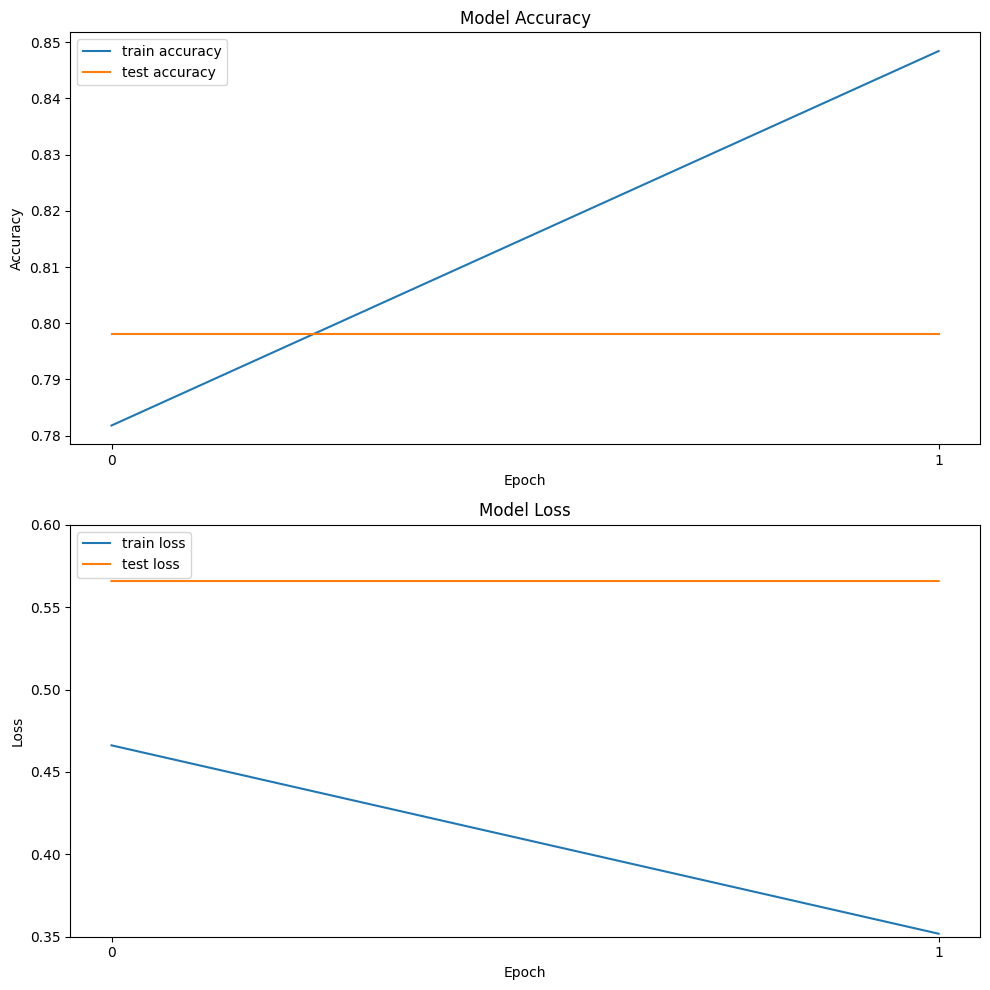

In [97]:
from matplotlib import pyplot as plt
from tensorflow.keras.models import load_model

def plot_model_performance(history):
    fig, axs = plt.subplots(2, 1, figsize=(10, 10))

    # Plot accuracy
    axs[0].plot(history.history['accuracy'], label='train accuracy')
    axs[0].plot(evals_accuracy, label='test accuracy')
    axs[0].set_title('Model Accuracy')
    axs[0].set_ylabel('Accuracy')
    axs[0].set_xlabel('Epoch')
    axs[0].legend(loc='upper left')
    axs[0].set_xticks([0,1])

    # Plot loss
    axs[1].plot(history.history['loss'], label='train loss')
    axs[1].plot(evals_loss, label='test loss')
    axs[1].set_title('Model Loss')
    axs[1].set_ylabel('Loss')
    axs[1].set_xlabel('Epoch')
    axs[1].legend(loc='upper left')
    axs[1].set_ylim([0.35, 0.60])
    axs[1].set_xticks([0,1])


    plt.tight_layout()
    plt.show()

plot_model_performance(history)

# train_accuracy = model.evaluate(train_set, verbose=1)[1]
#val_accuracy = model_400.evaluate(val_set, verbose=1)[1]

# print(f"Training Accuracy: {train_accuracy}")
# print(f"Validation Accuracy: {val_accuracy}")

## evaluate model on test

In [77]:
evals = model_400.evaluate(test_set_400, verbose=1)

Loading file from S3: test_400/pre1/images/img_numpy_train_400_pixels_batch_1000_imgs.npy
Loaded file: test_400/pre1/images/img_numpy_train_400_pixels_batch_1000_imgs.npy, shape: (20, 400, 400, 3)
Loading file from S3: test_400/pre1/labels/img_numpy_train_400_pixels_batch_1000_lbls.npy
Loaded file: test_400/pre1/labels/img_numpy_train_400_pixels_batch_1000_lbls.npy, shape: (20,)
Loaded image batch: test_400/pre1/images/img_numpy_train_400_pixels_batch_1000_imgs.npy, shape: (20, 400, 400, 3)
Loaded label batch: test_400/pre1/labels/img_numpy_train_400_pixels_batch_1000_lbls.npy, shape: (20,)
Loading file from S3: test_400/pre1/images/img_numpy_train_400_pixels_batch_1001_imgs.npy
Loaded file: test_400/pre1/images/img_numpy_train_400_pixels_batch_1001_imgs.npy, shape: (20, 400, 400, 3)
Loading file from S3: test_400/pre1/labels/img_numpy_train_400_pixels_batch_1001_lbls.npy
Loaded file: test_400/pre1/labels/img_numpy_train_400_pixels_batch_1001_lbls.npy, shape: (20,)
Loaded image batch: 

In [87]:
evals_loss = [0.5658919811248779, 0.5658930540084839]

In [86]:
evals_accuracy = [0.7979999780654907,0.7979999780654907]

In [89]:
evals

[0.5658930540084839, 0.7979999780654907]

In [98]:
model_400.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_2 (Conv2D)               │ (None, 398, 398, 112)  │         3,136 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 132, 132, 112)  │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 130, 130, 160)  │       161,440 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 43, 43, 160)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_1 (Flatten)             │ (None, 295840)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 256)            │    75,735,296 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 1)              │           257 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 227,700,389 (868.61 MB)

 Trainable params: 75,900,129 (289.54 MB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 151,800,260 (579.07 MB)